In [1]:
!pip3 install -qr requirements.txt

# Handstroke extraction

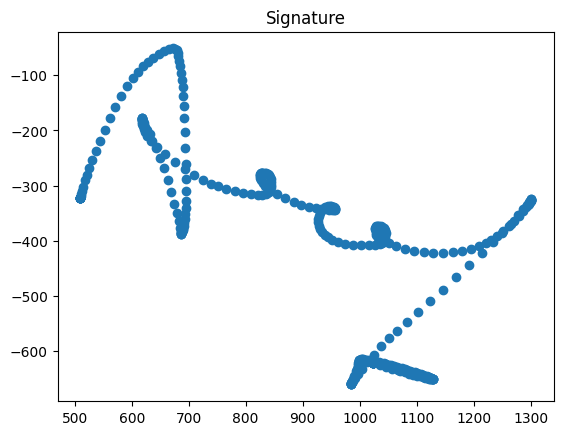

In [2]:
import numpy as np
import json
import scipy
import torch

from sigma_lognormal.plotting import *

from sigma_lognormal.preprocess import preprocess

with open("data/signatures.txt") as f:
	signatures = json.load(f)
	np_signatures = [np.array(signature) for signature in signatures]

signals = [preprocess(np_signature) for np_signature in np_signatures]

signal = signals[0]
plt.title("Signature")
show_plot("signals",[signal])

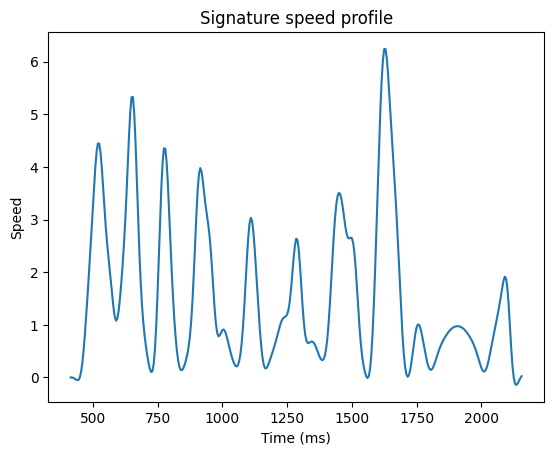

In [3]:
import matplotlib.pyplot as plt

plt.title("Signature speed profile")
plt.xlabel("Time (ms)")
plt.ylabel("Speed")
show_plot("speeds",[signal],should_scatter=False)

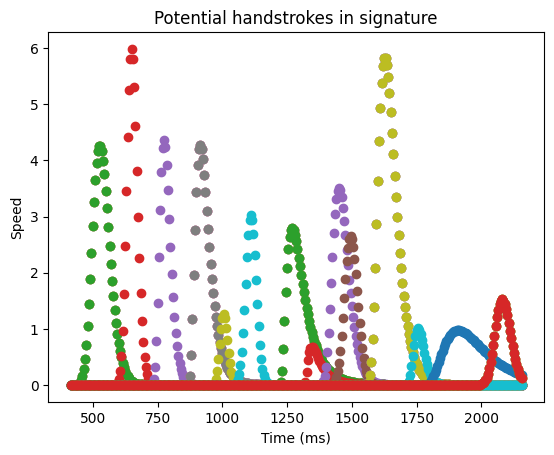

In [4]:
from sigma_lognormal.speed_extract import extract_all_lognormals

lognormals = extract_all_lognormals(signal)

plt.title("Potential handstrokes in signature")
plt.xlabel("Time (ms)")
plt.ylabel("Speed")
show_plot("speeds",[lgn.signal(signal.time) for lgn in lognormals])


In [5]:
from sigma_lognormal.beam_search import BeamSearch
from sigma_lognormal.action_plan import ActionPlan

top_k = 2
snr_threshold = 25
max_strokes = 30

# We use beam search to find the best set of handstrokes
search = BeamSearch(signal,top_k,snr_threshold,max_strokes)

In [6]:
import json

# To re-run the handstroke extraction algo, set use_cached to False
use_cached = True

if not use_cached:
    out_plan,snr_plot = search.search()

    with open("data/cached_plan.json","w") as f:
        json.dump(out_plan.to_json(),f)
else:
    out_plan = ActionPlan.from_json(json.load(open("data/cached_plan.json")))
out_signal = out_plan.signal(signal.time)

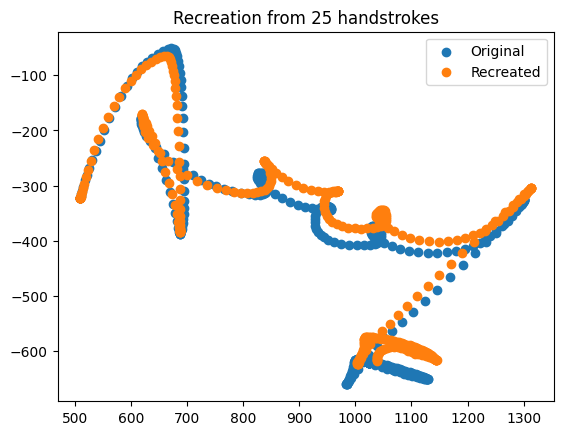

In [7]:
small_plan = out_plan.sub_plan(25)
small_signal = small_plan.signal(signal.time)
plt.title("Recreation from "+str(len(small_plan.strokes))+" handstrokes")
show_plot("signals",[signal,small_signal],legend=["Original","Recreated"])

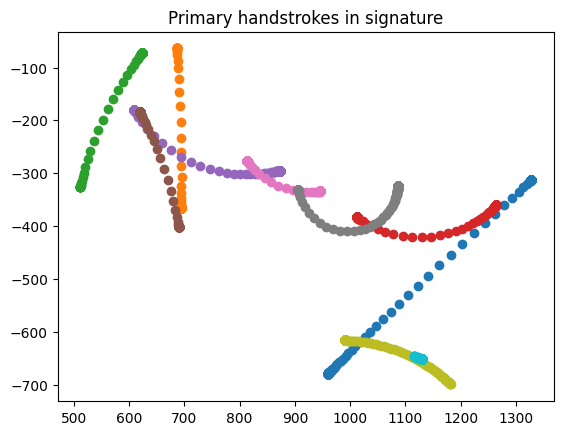

In [8]:
# Move a stroke to its position in the signature
def get_modified_stroke(stroke):
    base_signal = stroke.signal(signal.time)
    max_speed_time = stroke.time_of_max_speed()
    base_position_of_max_speed = stroke.position(max_speed_time)
    max_speed_signal_index = signal.find_closest_time(max_speed_time)
    real_position_of_max_speed = signal.position[max_speed_signal_index]

    position_offset = real_position_of_max_speed-base_position_of_max_speed
    return base_signal + position_offset

threshold = 150 # pixels in length

stroke_signals = [get_modified_stroke(stroke) for stroke in out_plan.strokes if stroke.D > threshold]

plt.title("Primary handstrokes in signature")
show_plot("signals",[*stroke_signals])

Now, we animate the signature (note: this visualization might be broken in the GitHub viewer).

In [9]:
animate_plot("signals",[signal,out_signal],title="Re-creation of signature",x_label="X position",y_label="Y position",legend=["Original","Re-created"])